In [1]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.decomposition  import PCA
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform

In [2]:
# PARAMETERS
path_prj  = '~/Dropbox/proyectos/crime2020/'
path_data = '~/data/crime/'

sz_stime = 336                                     # size of time serie 84 days x 4 jornadas
M        = sz_stime//2                             # number of samples extract from fourier time serie

In [4]:
dfnuse = pd.read_csv(path_data +'nuse_110220.csv', encoding='utf-8', error_bad_lines=False)

print(dfnuse.columns)
print('nuse shape:',dfnuse.shape)

/home/jorge/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (9,11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Index(['STR_NUMERO_INTERNO', 'FECHA', 'HORA', 'ANIO', 'MES', 'COD_LOCALIDAD',
       'LOCALIDAD', 'COD_UPZ', 'UPZ', 'COD_SEC_CATAST', 'SEC_CATASTRAL',
       'COD_BARRIO', 'BARRIO', 'TIPO_UNICO', 'TIPO_DETALLE', 'LATITUD',
       'LONGITUD', 'STR_DIRECCION_INCIDENTE', 'ESTADO_INCIDENTE', 'PERIODO_TS',
       'LOG_TEXT'],
      dtype='object')
nuse shape: (2268394, 21)


In [5]:
# Dataframe Nuse filtered and sorted
def data_crime(dfn):
    dfo = dfn[['LONGITUD', 'LATITUD', 'LOCALIDAD', 'COD_UPZ', 'UPZ', 'FECHA','MES','ANIO']].sort_values(by=['COD_UPZ'])
    dfo = dfo[((dfo['LATITUD']  >   4.43) & (dfo['LATITUD']  <   4.82)) & 
              ((dfo['LONGITUD'] > -74.22) & (dfo['LONGITUD'] < -74.01)) &
              ((dfo['COD_UPZ'] !=  'ND')  & (dfo['COD_UPZ']  != 'UPZ999')) ]
    dfo.reset_index(inplace=True)
    dfo = dfo.rename(columns={'index':'INDEX_TIME'})

    #Create the 'JORNADA' column
    sj = pd.to_datetime(dfo['FECHA'])
    hj = 6*(sj.dt.hour//6)
    dfo['JORNADA'] = [x.replace(hour=y, minute=0, second=0) for x,y in zip(sj, hj)]
    return dfo

# resume of UPZ data
def data_upz(dfc, save=False):
    dfcx = dfc.groupby(['COD_UPZ', 'UPZ'])[['LATITUD', 'LONGITUD']].mean()
    dfcx['NUM']    = dfc.groupby(['COD_UPZ', 'UPZ'])['LATITUD'].count()
    dfcx['qlat25'] = dfc.groupby(['COD_UPZ', 'UPZ'])['LATITUD'].quantile(0.25)
    dfcx['qlat75'] = dfc.groupby(['COD_UPZ', 'UPZ'])['LATITUD'].quantile(0.75)
    dfcx['qlon25'] = dfc.groupby(['COD_UPZ', 'UPZ'])['LONGITUD'].quantile(0.25)
    dfcx['qlon75'] = dfc.groupby(['COD_UPZ', 'UPZ'])['LONGITUD'].quantile(0.75)
    dfcx['HLAT']   = 1.5*(dfcx['qlat75']-dfcx['qlat25'])*112
    dfcx['HLON']   = 1.5*(dfcx['qlon75']-dfcx['qlon25'])*112
    dfcx.reset_index(inplace=True)
    dfcx.rename(columns={'LATITUD':'CXLAT', 'LONGITUD':'CXLON'}, inplace=True)
    dfcx.sort_values('COD_UPZ', inplace=True)
    dfout = dfcx[['COD_UPZ', 'UPZ', 'NUM', 'CXLAT', 'CXLON', 'HLAT', 'HLON']].copy()
    
    if save:
        dfout.to_excel(path_prj+'results/upz_centroids.xlsx', encoding='utf-8')
    return dfout

# resume of mes_UPZ data
def data_mon_upz(dfc, save=False):
    dfcx = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])[['LATITUD', 'LONGITUD']].mean()
    dfcx['NUM']    = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])['LATITUD'].count()
    dfcx['qlat25'] = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])['LATITUD'].quantile(0.25)
    dfcx['qlat75'] = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])['LATITUD'].quantile(0.75)
    dfcx['qlon25'] = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])['LONGITUD'].quantile(0.25)
    dfcx['qlon75'] = dfc.groupby(['COD_UPZ', 'UPZ', 'MES'])['LONGITUD'].quantile(0.75)
    dfcx['HLAT']   = 1.5*(dfcx['qlat75']-dfcx['qlat25'])*112
    dfcx['HLON']   = 1.5*(dfcx['qlon75']-dfcx['qlon25'])*112
    dfcx.reset_index(inplace=True)
    dfcx.rename(columns={'LATITUD':'CXLAT', 'LONGITUD':'CXLON'}, inplace=True)
    #dfcx.sort_values('COD_UPZ', inplace=True)
    dfout = dfcx[['COD_UPZ', 'UPZ', 'MES', 'NUM', 'CXLAT', 'CXLON', 'HLAT', 'HLON']].copy()
    
    if save:
        dfout.to_csv(path_prj+'results/mes_upz_centroids.csv', index=False)
    return dfout

# group data by jornada definition
def data_upz_jornada(dfc):
    dfout = dfc.pivot_table(index   = ['JORNADA'], 
                            columns = ['COD_UPZ'],
                            values  =  'UPZ', 
                            aggfunc =  'count', 
                            fill_value=0).unstack().to_frame().rename(columns={0:'EVENTS'})
    dfout.reset_index(inplace=True)
    dfout['MES']  = dfout['JORNADA'].dt.month
    dfout['ANIO'] = dfout['JORNADA'].dt.year
    return dfout

# count monthly events by upz
def data_month(dfin):
    dfout = dfin.groupby(['ANIO', 'MES'])['COD_UPZ'].count().to_frame()
    dfout.reset_index(inplace=True)
    dfout.rename(columns={'COD_UPZ':'NUM_U'}, inplace=True)
    return dfout


dfcrime = data_crime(dfnuse)
print('CRIME shape:', dfcrime.shape)
print('Columns dfcrime', dfcrime.columns)
print('--'*40)


dfupz = data_upz(dfcrime)
szu   = len(dfupz)
lupz  = dfupz['COD_UPZ'].to_list()
print('UPZ shape:', dfupz.shape)
print('Columns dfupz', dfupz.columns)
print('--'*40)


dfuj = data_upz_jornada(dfcrime)
print('UPZ_JORNADA shape:', dfuj.shape)
print('dataframe: UPZ[%d] x JORNADA(dias:2154x4):'%szu)
print('Columns dfuj', dfuj.columns)
print('--'*40)


dfmon = data_month(dfuj)
szm = len(dfmon)
print('MONTH shape:', dfmon.shape)
print('Columns dfmon', dfmon.columns)
print('--Init month:', dfmon.iloc[0,1],  dfmon.iloc[0,0]) 
print('--Last month:', dfmon.iloc[-1,1], dfmon.iloc[-1,0]) 
print('--'*40)



CRIME shape: (2235552, 10)
Columns dfcrime Index(['INDEX_TIME', 'LONGITUD', 'LATITUD', 'LOCALIDAD', 'COD_UPZ', 'UPZ',
       'FECHA', 'MES', 'ANIO', 'JORNADA'],
      dtype='object')
--------------------------------------------------------------------------------
UPZ shape: (114, 7)
Columns dfupz Index(['COD_UPZ', 'UPZ', 'NUM', 'CXLAT', 'CXLON', 'HLAT', 'HLON'], dtype='object')
--------------------------------------------------------------------------------
UPZ_JORNADA shape: (982224, 5)
dataframe: UPZ[114] x JORNADA(dias:2154x4):
Columns dfuj Index(['COD_UPZ', 'JORNADA', 'EVENTS', 'MES', 'ANIO'], dtype='object')
--------------------------------------------------------------------------------
MONTH shape: (71, 3)
Columns dfmon Index(['ANIO', 'MES', 'NUM_U'], dtype='object')
--Init month: 1 2014
--Last month: 11 2019
--------------------------------------------------------------------------------


In [8]:
dfuj5 = dfuj[dfuj.JORNADA < '2019-01-02']
dfuj5.shape[0]/szu

7308.0

In [9]:
######## Interactive plot of events per jornada, select UPZ
#### PRAMETERS UPZ x JORNADA
upz = "UPZ28"

lst  = dfuj5[dfuj5.COD_UPZ==upz]['EVENTS'].to_list()
date = dfuj5[dfuj5.COD_UPZ==upz]['JORNADA'].to_list()
lst1 = [lst[x]  for x in range(len(lst))  if x%4==0]
dat1 = [date[x] for x in range(len(date)) if x%4==0]
lst2 = [lst[x]  for x in range(len(lst))  if x%4==1]
dat2 = [date[x] for x in range(len(date)) if x%4==1]
lst3 = [lst[x]  for x in range(len(lst))  if x%4==2]
dat3 = [date[x] for x in range(len(date)) if x%4==2]
lst4 = [lst[x]  for x in range(len(lst))  if x%4==3]
dat4 = [date[x] for x in range(len(date)) if x%4==3]

fig = go.Figure()
fig.add_trace(go.Scatter(x=dat1, y=lst1, name='J:00-06', mode='lines+markers'))
fig.add_trace(go.Scatter(x=dat2, y=lst2, name='J:06-12', mode='lines+markers'))
fig.add_trace(go.Scatter(x=dat3, y=lst3, name='J:12-18', mode='lines+markers'))
fig.add_trace(go.Scatter(x=dat4, y=lst4, name='J:18-24', mode='lines+markers'))        
fig.update_layout(title='Interactive: Events per Jornada in '+ upz,
                   xaxis_title='Date Time',
                   yaxis_title='Number of incidents')
fig.show()

/home/jorge/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning:

In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.

/home/jorge/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning:

In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.



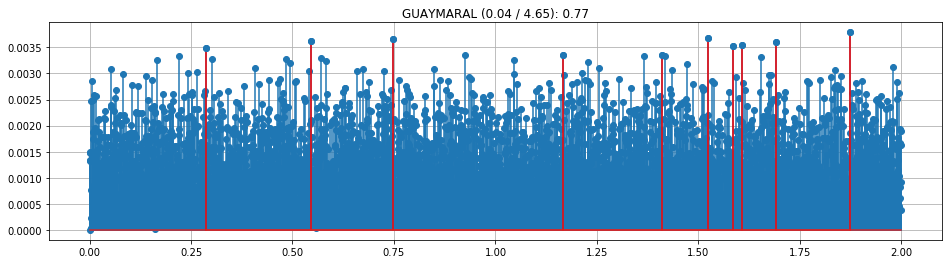

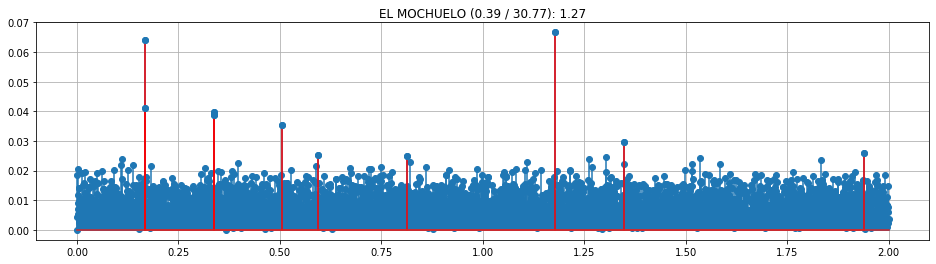

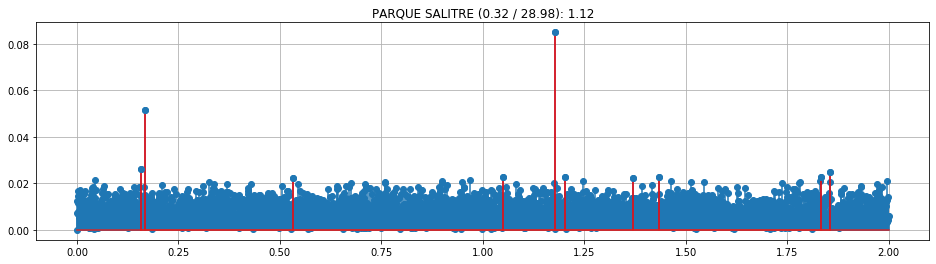

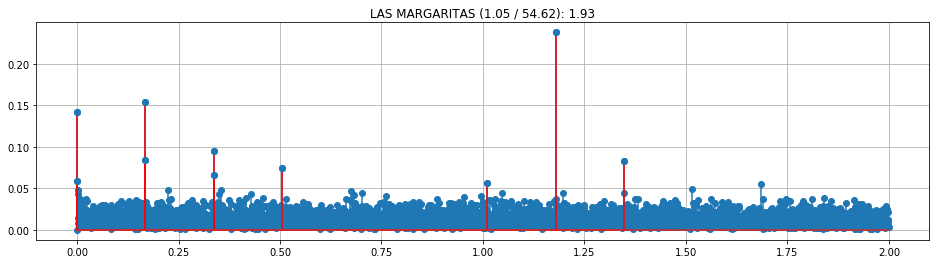

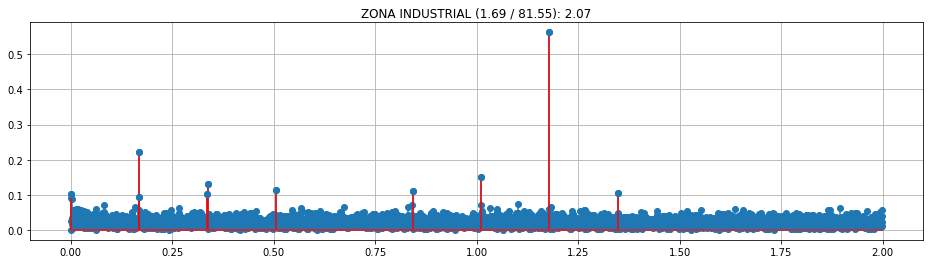

...

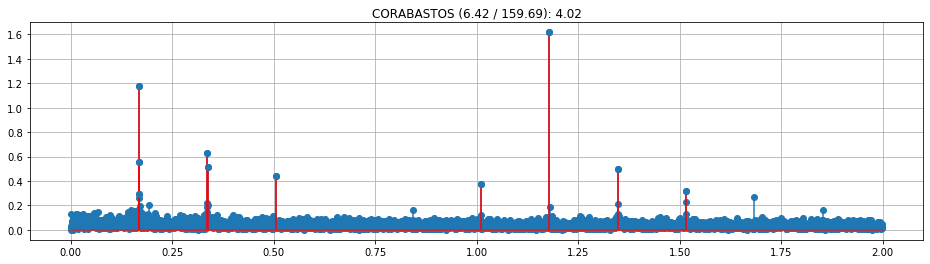

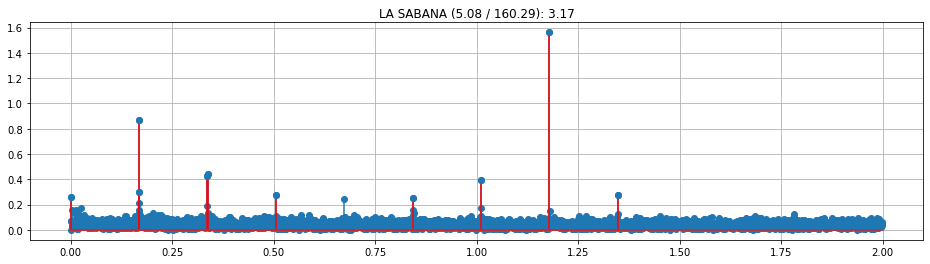

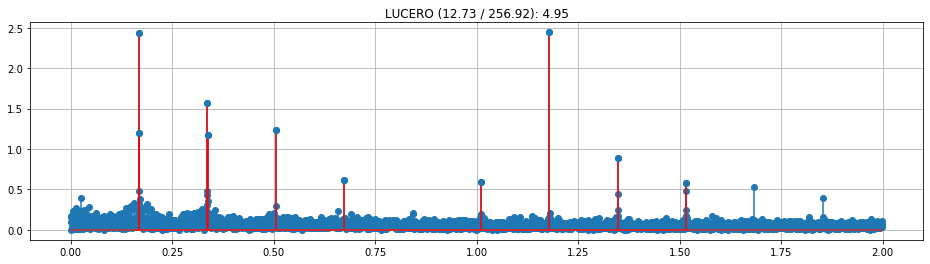

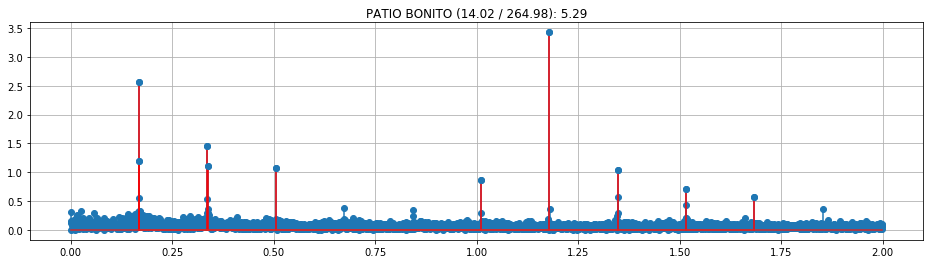

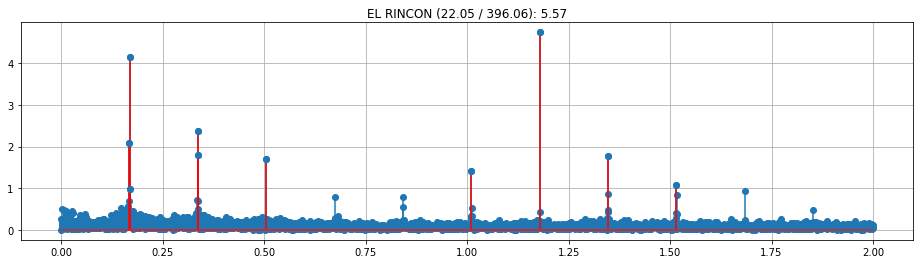

In [11]:
pi = np.pi
T  = 7*261
fs = 4
t  = np.arange(0, T, 1/fs)

def scaleSpec(x, factor=16):
    e = 2.71828
    y = factor*(x-x.mean())/(1+x.std())
    return 1/(1 + e**(-y))

def get_upz(supz, col='UPZ'):
    s1 = dfupz[dfupz['COD_UPZ']==supz][col]
    return s1.values[0]

w1 = np.arange(0, fs/2, 1/T)
szk = len(w1)
sel_upz = ['UPZ3', 'UPZ63', 'UPZ103', 'UPZ83', 'UPZ108', 'UPZ99', 'UPZ93', 'UPZ80', 'UPZ102', 'UPZ67', 'UPZ82', 'UPZ28']

for u in sel_upz:
    x  = dfuj[dfuj['COD_UPZ']==u]['EVENTS']
    xk = np.fft.fft(x)*2/len(x)
    sk = np.absolute(xk[:szk]); sk[0] = 0
    total = np.sum(sk)
    ndx = np.argsort(sk)
    sub = np.sum(sk[ndx[szk-10:]])
    fig = plt.figure(figsize=(16,4))
    plt.stem(w1, sk)
    plt.stem(w1[ndx[szk-10:]], sk[ndx[szk-10:]], 'r')
    plt.title('%s (%1.2f / %1.2f): %1.2f'%(get_upz(u),sub,total,100*sub/total)); 
    plt.grid(); plt.show()
    

In [10]:
dfmu = data_mes_upz(dfcrime, save=True)
print('mesUPZ shape:', dfmu.shape)
print('Columns dfupz', dfmu.columns)
dfmu

NameError: name 'data_mes_upz' is not defined

In [11]:
# Calculate and scale the spectrograms 

ftorSigm = 4
def scaleSpec(x, factor=16):
    e = 2.71828
    y = factor*(x-x.mean())/(1+x.std())
    return 1/(1 + e**(-y))

fs  = 4
wk  = np.arange(0, fs//2, fs/sz_stime)

# Espectrograma por upz
spec = np.zeros((szu*szm, M), dtype=float)

# Calculo del índice de inicio de cada mes 
ndx = []
for i, rs in dfmon.iterrows():
    dt = datetime.datetime(rs.ANIO, rs.MES, 1, 0, 0, 0)
    n  = dfuj[dfuj['JORNADA']==dt].index.values
    ndx.append(n[0])
    
k = 0;
for u in lupz:
    dff = dfuj[dfuj['COD_UPZ']==u]
    for n in ndx:
        if n+sz_stime > len(dff.index): 
            k = k+1
            break
        arr = np.array(dff['EVENTS'][n:n+sz_stime])
        ark = np.fft.fft(arr)
        mark = scaleSpec(np.absolute(ark[:M]), ftorSigm)
        if(True in np.isnan(mark)):
            print(u, n, k, mark, arr)
        spec[[k], :] = mark
        k = k+1        
        

### Análisis de fourier
__1. Muestreo de función seno:__
- Dada una función seno de frecuencia $f_o$, muestreada con una frecuencia de muestreo $f_s$ durante un tiempo total $T$. Se genera la señal con muestras en el tiempo: $t = 0, 1/f_s, 2/f_s, \dots ,T$, de la siguiente forma:
$$ x = \sin(2\pi t f_o) $$
La cantidad de muestras es $N = T\cdot f_s$, los índices de las muestras son: $n = 0, 1, 2, \dots, N-1$, Entonces alternativamente, la función seno se puede definir como: $ x = \sin(\frac{2\pi n T f_o}{N})$
__2. Análisis de la función__
- Asumiendo que se tienen priodos completos de la función muestreados se aplica la transformada de fourier discreta en el tiempo:
$$X_k = \frac{1}{\sqrt{(N)}}\sum_{i=0}^{N-1}x_n e^{-\frac{2\pi i}{n}kn}, \quad \quad n = 0,1,\dots ,N-1  $$



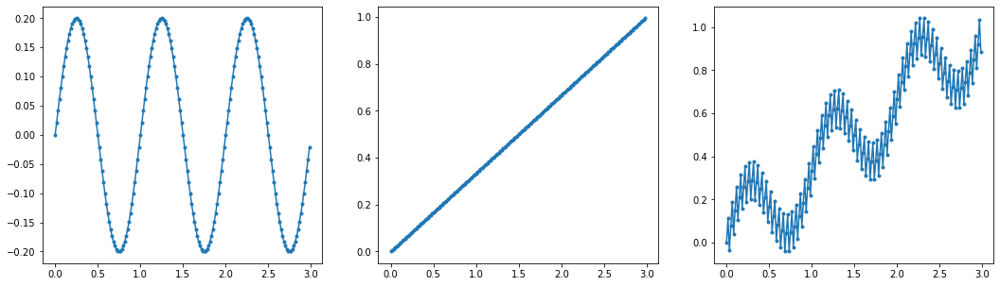

/home/jorge/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:35: UserWarning:

In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.



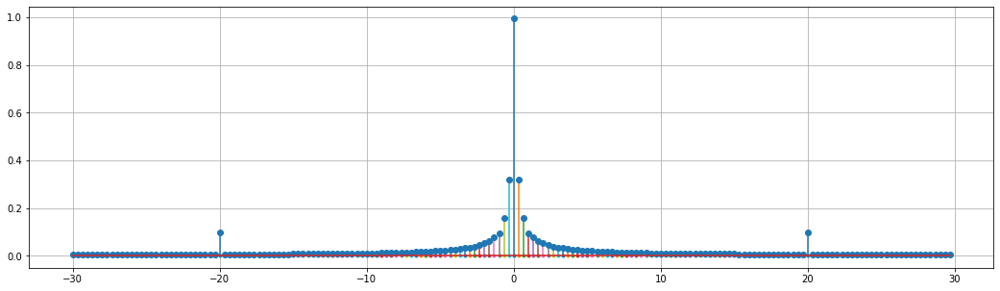

/home/jorge/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning:

In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.



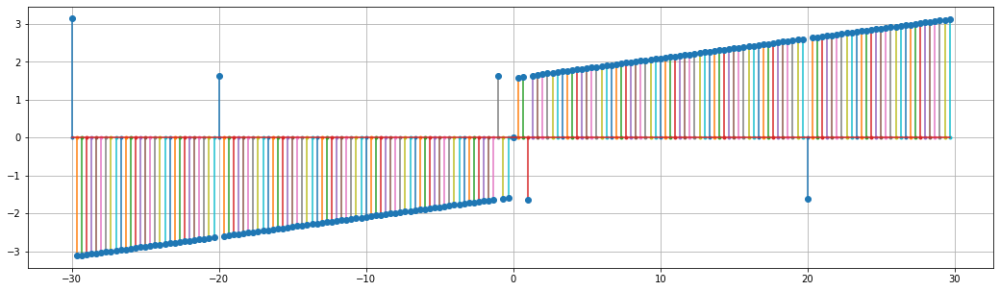

In [25]:
d  = 7*261
pi = np.pi
#-----------------
T  = 28
fs = 4
fo_1 = 1/7
fo_2 = 1/4
T  = 3
fs = 60
fo_1 = 20
fo_2 = 1
t  = np.arange(0, T, 1/fs)
x3 = np.sin(2*pi*t*fo_1)*0.1
x1 = np.sin(2*pi*t*fo_2)*0.2
x2 = np.arange(0,180)/180
x  = x1 + x2 + x3

fig = plt.figure(figsize=(18,5))
plt.subplot(1,3,1)
plt.plot(t, x1, '.-')
plt.subplot(1,3,2)
plt.plot(t, x2, '.-')
plt.subplot(1,3,3)
plt.plot(t, x, '.-')

xk = np.fft.fft(x)*2/len(x)
w1 = np.arange(0, fs/2, 1/T)
w2 = np.arange(-fs/2, 0, 1/T)
wd = len(w1)
w  = np.zeros(2*wd)
w[:wd] = w1
w[wd:] = w2
plt.show()
fig = plt.figure(figsize=(18,5))
plt.stem(w, abs(xk), '.-')
plt.grid()
plt.show()
fig = plt.figure(figsize=(18,5))
plt.stem(w, np.angle(xk), '.-')
plt.grid()


## Short time fourier transform 
1. Define sections of the signal where complete periods appear
2. Determine the range of frequencies to be extracted
3. Apply low-pass and high-pass filters to remove frequencies out of range
4. Alternatively, apply window functions like those in the figure
5. Calculate the Fourier transform to the signal

![figures](../docs/presentEspectro/ventanas.png)


  0 UPR1 	UPR ZONA NORTE
  1 UPR3 	UPR RIO TUNJUELO
  2 UPZ1 	PASEO DE LOS LIBERTADORES
  3 UPZ10 	LA URIBE
  4 UPZ100 	GALERIAS
  5 UPZ101 	TEUSAQUILLO
  6 UPZ102 	LA SABANA
  7 UPZ103 	PARQUE SALITRE
  8 UPZ104 	PARQUE SIMON BOLIVAR - CAN
  9 UPZ105 	JARDIN BOTANICO
 10 UPZ106 	LA ESMERALDA
 11 UPZ107 	QUINTA PAREDES
 12 UPZ108 	ZONA INDUSTRIAL
 13 UPZ109 	CIUDAD SALITRE ORIENTAL
 14 UPZ11 	SAN CRISTOBAL NORTE
 15 UPZ110 	CIUDAD SALITRE OCCIDENTAL
 16 UPZ111 	PUENTE ARANDA
 17 UPZ112 	GRANJAS DE TECHO
 18 UPZ113 	BAVARIA
 19 UPZ114 	MODELIA
 20 UPZ115 	CAPELLANIA
 21 UPZ116 	ALAMOS
 22 UPZ117 	AEROPUERTO EL DORADO
 23 UPZ12 	TOBERIN
 24 UPZ13 	LOS CEDROS
 25 UPZ14 	USAQUEN
 26 UPZ15 	COUNTRY CLUB
 27 UPZ16 	SANTA BARBARA
 28 UPZ17 	SAN JOSE DE BAVARIA
 29 UPZ18 	BRITALIA
 30 UPZ19 	EL PRADO
 31 UPZ2 	LA ACADEMIA
 32 UPZ20 	LA ALHAMBRA
 33 UPZ21 	LOS ANDES
 34 UPZ22 	DOCE DE OCTUBRE
 35 UPZ23 	CASA BLANCA SUBA
 36 UPZ24 	NIZA
 37 UPZ25 	LA FLORESTA
 38 UPZ26 	LAS FERIAS
 39 UPZ27 	SUB

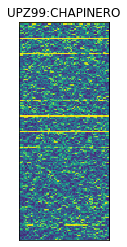

In [114]:
# SAVE spectrograms 
w = szm-1
for u in range(szu):
    im = spec[u*w:(u+1)*w, :]
    im = im.T
    plt.title(dfupz.iloc[u][0]+':'+ str(dfupz.iloc[u][1]))
    #plt.ylabel('Frequency (2hz, 0hz)')
    #plt.xlabel('Months')
    plt.tick_params(axis='x', which='both',bottom=False, top=False, labelbottom=False)
    plt.tick_params(axis='y', which='both',left=False, right=False, labelleft=False)
    plt.imshow(im)
    plt.imsave('/home/jorge/Dropbox/proyectos/crime2020/results/spectrograms/'+dfupz.iloc[u][1]+'_'+str(u)+'.png', im)
    print('%3d %s \t%s'%(u, dfupz.iloc[u][0], dfupz.iloc[u][1]))
    
# fig = plt.figure(figsize=(18,80))    
# for u in range(szu):
#     im = spec[u*w:(u+1)*w, :]
#     im = im.T
#     plt.subplot(15, 8, u+1)
#     s1 = dfupz.iloc[u][1]
#     if len(s1) > 16:
#         s1 = s1[:16]
#     plt.title(s1)
#     if(u%8==0):
#         plt.ylabel('Frequency (2hz, 0hz)')
#     #plt.xlabel('Months')
#     plt.tick_params(axis='x', which='both',bottom=False, top=False, labelbottom=False)
#     plt.tick_params(axis='y', which='both',left=False, right=False, labelleft=False)
#     plt.imshow(im)
    


<Figure size 1008x504 with 0 Axes>

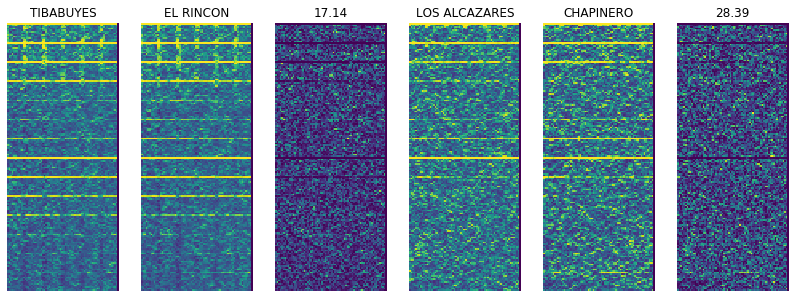

In [6]:
def displayImg(im, tit, row, col, num):
    plt.subplot(row, col, num)
    plt.imshow(im)
    plt.title(tit)
    plt.ylabel('Frequency (2hz, 0hz)')
    plt.xlabel('Months')
    plt.axis('off')

def specAnalysis(i1, i2, i3, i4):
    w = szm-1
    fig = plt.figure(figsize=(14,7))    
    im1 = spec[i1*w:(i1+1)*w, :].T
    im2 = spec[i2*w:(i2+1)*w, :].T
    im3 = np.absolute(im1-im2)
    dif = (im1-im2)**2
    val = dif.sum().sum()
    val = (val**0.5).round(2)
    displayImg(im1, dfupz.iloc[i1][1], 1, 6, 1)
    displayImg(im2, dfupz.iloc[i2][1], 1, 6, 2)
    displayImg(im3, val, 1, 6, 3)

    im4 = spec[i3*w:(i3+1)*w, :].T
    im5 = spec[i4*w:(i4+1)*w, :].T
    im6 = np.absolute(im4-im5)
    dif = (im4-im5)**2
    val = dif.sum().sum()
    val = (val**0.5).round(2)
    displayImg(im4, dfupz.iloc[i3][1], 1, 6, 4)
    displayImg(im5, dfupz.iloc[i4][1], 1, 6, 5)
    displayImg(im6, val, 1, 6, 6)

def distance2():
    k = 0;
    w = szm-1
    dst = []
    for i in range(szu-1):
        x = spec[i*w:(i+1)*w, :]
        for j in range(i+1, szu):
            y = spec[j*w:(j+1)*w, :]
            d = (x-y)**2
            dst.append((d.sum().sum())**0.5)
            k = k+1
    return np.array(dst)

fig = plt.figure(figsize=(14,7))    
specAnalysis(84, 40, 112, 113)

In [ ]:
# PCA analysis of UPZ per month
pca = PCA(n_components=3)
pca.fit(spec.T)
data = pca.components_
#print('sigular values', pca.singular_values_)
#print('expl variance', pca.explained_variance_)
cum = 0
print('variance ratio (acum)')
for i, e in enumerate(pca.explained_variance_ratio_):
    cum += e*100
    print('%2dth\t%2.2f\t%2.2f'%(i+1, e*100, cum))
print('data shape', data.shape)





spec_upz shape: (114, 11928)
dist shape: (6441,)
pca ratio% [14.88733544  1.6966394   1.58059889  1.52161807  1.48110183  1.46273518
  1.42586792  1.36262736  1.33429492  1.29507854  1.27782324  1.26809917
  1.23667573  1.20352654  1.19530731  1.17821252  1.16978656  1.13923756
  1.12685713  1.11516205  1.09378145  1.08540589  1.07741091  1.07261788
  1.06389157  1.04482249  1.04127701  1.00098281  0.99052705  0.98036114
  0.95427105  0.94683946  0.93882903  0.92583621  0.91530996  0.90744828
  0.88554875  0.87715713  0.87276326  0.85417372  0.85028644  0.83622354
  0.83278365  0.81700702  0.81026895  0.80217314  0.77460076  0.77204123
  0.75715557  0.75319743  0.74243164  0.7358124   0.72894448  0.71911096
  0.71318071  0.69180435  0.68274366  0.67087631  0.66732     0.66356143
  0.64549045  0.64351645  0.63930217  0.63107731  0.62739742  0.62398244
  0.60944208  0.60515813  0.59883891  0.59287648  0.58614807  0.582064
  0.57070889  0.55859522  0.54617622  0.54067855  0.53296814  0.52

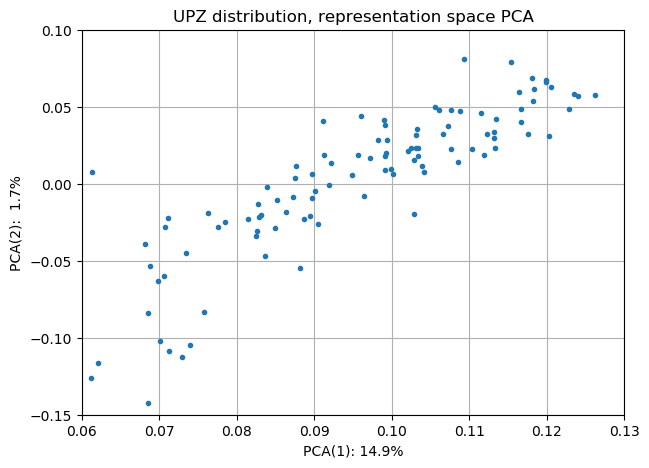

In [25]:
# PCA analysis per UPZ
def distance():
    k = 0;
    dst = []
    for i in range(szu-1):
        x = spec_upz[i, :]
        for j in range(i+1, szu):
            y = spec_upz[j, :]
            d = (np.dot(x-y, x-y))**0.5
            dst.append(d)
            k = k+1
    return np.array(dst)

spec_upz = np.zeros((szu, szm*M), dtype=float)
for i in range(szu):
    spec_upz[i, :] = spec[i*szm:(i+1)*szm, :].ravel()
# dist = pdist(spec_upz)


dist = distance2()
print('spec_upz shape:', spec_upz.shape)
print('dist shape:', dist.shape)

pca = PCA(n_components=99)
pca.fit(spec_upz.T)
data = pca.components_
print('pca ratio%', 100*pca.explained_variance_ratio_)
print('pca shape:', data.shape)
print('pca acum info:', pca.explained_variance_ratio_.sum())

fig = plt.figure(figsize=(7, 5))
plt.plot(data[0,:], data[1,:], '.')
plt.axis([0.06, 0.13, -0.15, 0.1])
plt.xlabel('PCA(1): 14.9%')
plt.ylabel('PCA(2):  1.7%')
plt.title('UPZ distribution, representation space PCA')
plt.grid()



  0-->	UPZ28   	UPZ71	17.14
  1-->	UPZ28   	UPZ84	17.54
  2-->	UPZ71   	UPZ84	17.64
  3-->	UPZ28   	UPZ85	18.25
  4-->	UPZ84   	UPZ85	18.28
  5-->	UPZ71   	UPZ85	18.33
  6-->	UPZ71   	UPZ82	18.82
  7-->	UPZ28   	UPZ82	18.89
  8-->	UPZ82   	UPZ84	18.97
  9-->	UPZ67   	UPZ71	19.39
 10-->	UPZ28   	UPZ67	19.73
 11-->	UPZ28   	UPZ47	19.76
 12-->	UPZ67   	UPZ84	19.78
 13-->	UPZ82   	UPZ85	19.82
 14-->	UPZ47   	UPZ84	19.89
 15-->	UPZ28   	UPZ42	20.03
 16-->	UPZ47   	UPZ71	20.03
 17-->	UPZ42   	UPZ84	20.08
 18-->	UPZ42   	UPZ71	20.17
 19-->	UPZ28   	UPZ75	20.26
 20-->	UPZ28   	UPZ74	20.31
 21-->	UPZ75   	UPZ84	20.40
 22-->	UPZ67   	UPZ85	20.44
 23-->	UPZ71   	UPZ74	20.46
 24-->	UPZ74   	UPZ84	20.48
 25-->	UPZ28   	UPZ69	20.51
 26-->	UPZ69   	UPZ84	20.56
 27-->	UPZ84   	UPZ86	20.65
 28-->	UPZ71   	UPZ75	20.77
 29-->	UPZ28   	UPZ86	20.77
 30-->	UPZ69   	UPZ71	20.78


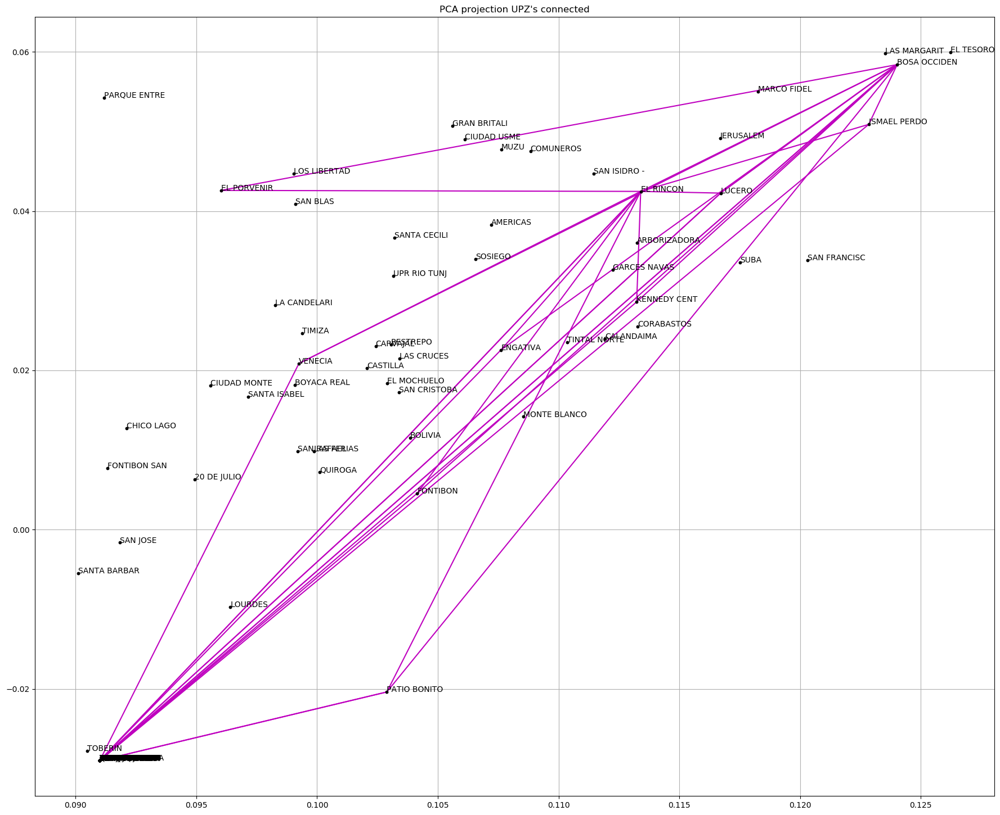

In [15]:
# Display spectrograms in the representation space use a distance metric

def get_index(Z, N):
    i = int((2*N - 1 - ((2*N-1)**2 - 8*Z)**0.5)/2)
    j = int(Z + 1 - i*(2*N - i - 3)/2)
    return i, j

def iget_index(i, j, N):
    i, j = (j, i) if j<i else (i, j)
    return int(i*(2*N-i-3)/2 + j -1)

def meanshift_rad(dist, I, N, r, ax):
    c1 = np.arange(N)
    K  = N

    k = 0
    while(r >= dist[I[k]]):
        i, j = get_index(I[k], N)
        ax.plot([poin[[0],i], poin[[0],j] ], [poin[[1],i], poin[[1],j]], 'm')
        print('%3d-->\t%s   \t%s\t%5.2f'%(k, dfupz.iloc[i][0], dfupz.iloc[j][0], dist[I[k]]))
        if c1[i] != c1[j]:
            K = K-1
            a, b = (c1[i], c1[j]) if c1[i]<c1[j] else (c1[j], c1[i])
            c1 = [a if x==b else x for x in c1]
        k = k+1
    return c1, K

poin = data.copy()
for i in range(szu):
    if (data[0,i]< 0.09) or (data[0,i]>0.13) or (data[1,i]< -0.03) or (data[1,i]>0.06):
        poin[[0],i] = 0.091
        poin[[1],i] = -0.029

ndxDist = np.argsort(dist)

fig, ax = plt.subplots(figsize=(22,18))

plt.plot(poin[0,:], poin[1,:], '.k')


clusters, k = meanshift_rad(dist, ndxDist, szu, dist[ndxDist[30]], ax)
# print('number of clusters:', k)
# print(clusters)
plt.plot(poin[0,:], poin[1,:], '.k')
for i in range(szu):
    s1 = dfupz.iloc[i][1]
    if len(s1) > 12:
        s1 = s1[:12]
    plt.annotate(s1, (poin[0, i], poin[1, i]))

plt.title("PCA projection UPZ's connected")
plt.grid()


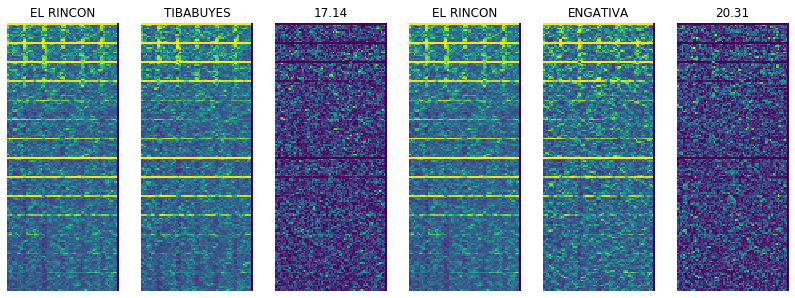

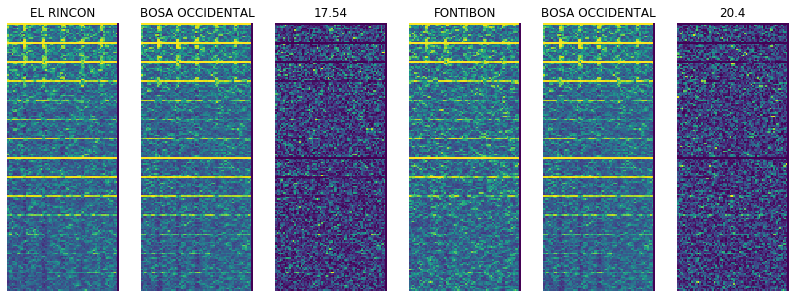

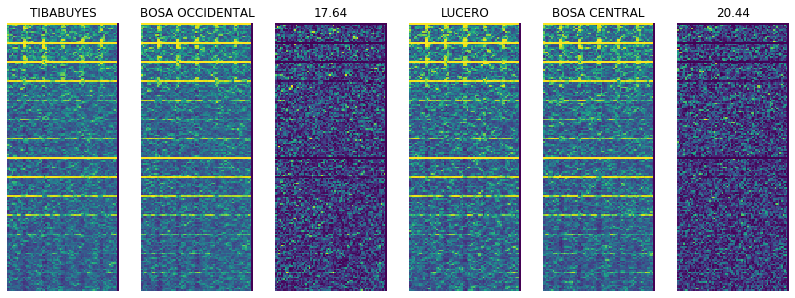

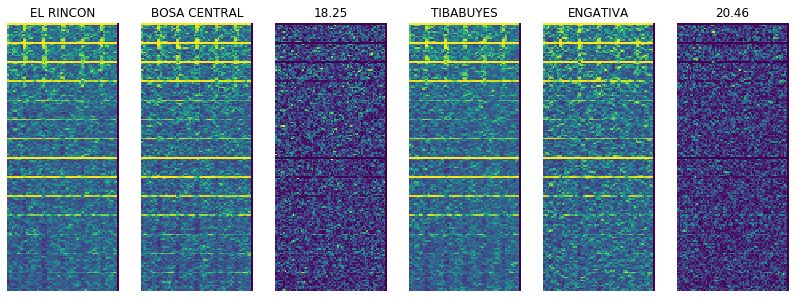

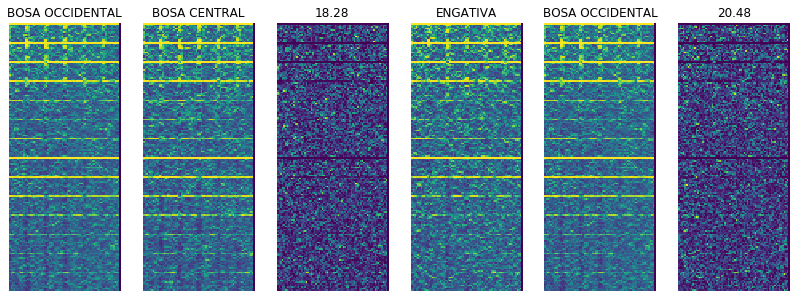

...

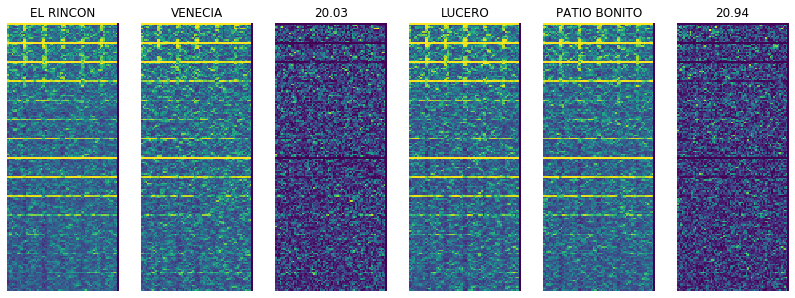

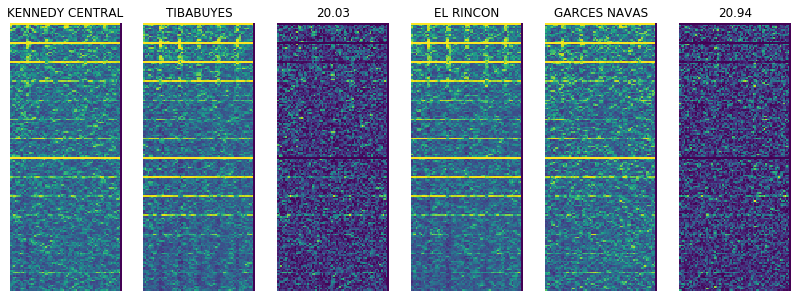

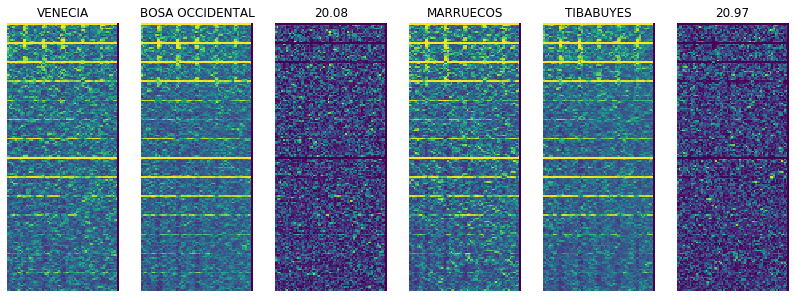

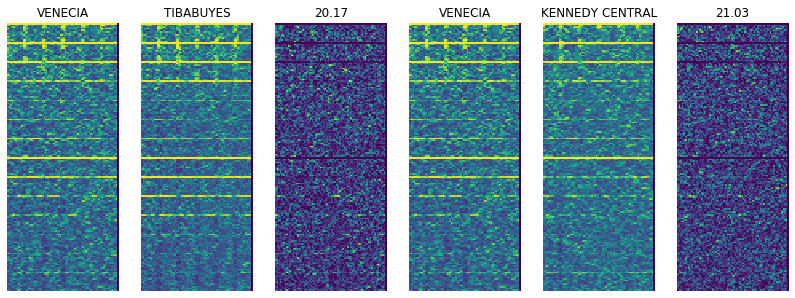

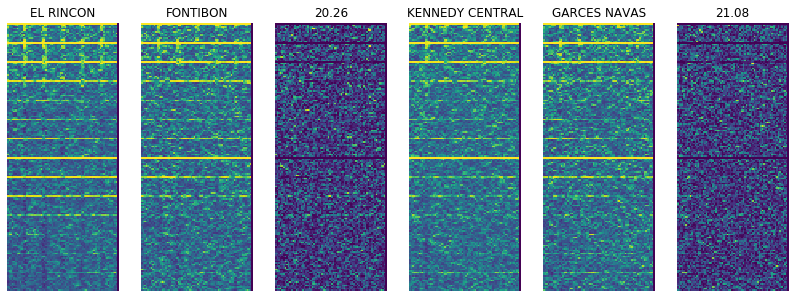

In [111]:
n = 20
for k in range(n):
    i, j = get_index(ndxDist[k], szu)
    r, s = get_index(ndxDist[k+n], szu)
    specAnalysis(i, j, r, s)
    plt.show()

![similar spectrograms](../results/spec_sim.png)

In [113]:
n = 40
for k in range(n):
    i, j = get_index(ndxDist[k], szu)
    print('%2d %s    \t%s'%(k, dfupz.iloc[i][1], dfupz.iloc[j][1]))


 0 EL RINCON    	TIBABUYES
 1 EL RINCON    	BOSA OCCIDENTAL
 2 TIBABUYES    	BOSA OCCIDENTAL
 3 EL RINCON    	BOSA CENTRAL
 4 BOSA OCCIDENTAL    	BOSA CENTRAL
 5 TIBABUYES    	BOSA CENTRAL
 6 TIBABUYES    	PATIO BONITO
 7 EL RINCON    	PATIO BONITO
 8 PATIO BONITO    	BOSA OCCIDENTAL
 9 LUCERO    	TIBABUYES
10 EL RINCON    	LUCERO
11 EL RINCON    	KENNEDY CENTRAL
12 LUCERO    	BOSA OCCIDENTAL
13 PATIO BONITO    	BOSA CENTRAL
14 KENNEDY CENTRAL    	BOSA OCCIDENTAL
15 EL RINCON    	VENECIA
16 KENNEDY CENTRAL    	TIBABUYES
17 VENECIA    	BOSA OCCIDENTAL
18 VENECIA    	TIBABUYES
19 EL RINCON    	FONTIBON
20 EL RINCON    	ENGATIVA
21 FONTIBON    	BOSA OCCIDENTAL
22 LUCERO    	BOSA CENTRAL
23 TIBABUYES    	ENGATIVA
24 ENGATIVA    	BOSA OCCIDENTAL
25 EL RINCON    	ISMAEL PERDOMO
26 ISMAEL PERDOMO    	BOSA OCCIDENTAL
27 BOSA OCCIDENTAL    	EL PORVENIR
28 TIBABUYES    	FONTIBON
29 EL RINCON    	EL PORVENIR
30 ISMAEL PERDOMO    	TIBABUYES
31 KENNEDY CENTRAL    	PATIO BONITO
32 TIBABUYES    	EL P

dist shape (6441,)
<class 'numpy.ndarray'>


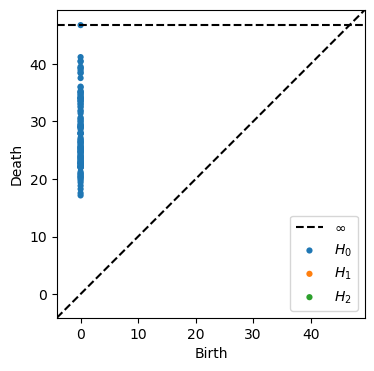

In [18]:
from ripser import ripser
from persim import plot_diagrams

sqdist = squareform(dist)
print('dist shape', dist.shape)
print(type(dist))

diagrams = ripser(sqdist, distance_matrix=True, maxdim=2)['dgms']

fig = plt.figure(figsize=(4, 4))
plot_diagrams(diagrams)
